In [ ]:
import webbrowser

webbrowser.open('http://cdn.gea.esac.esa.int/Gaia/gdr3/gaia_source/')

webbrowser.open('http://cdn.gea.esac.esa.int/Gaia/gdr3/Astrophysical_parameters/astrophysical_parameters/')

webbrowser.open('http://cdn.gea.esac.esa.int/Gaia/gdr3/')

webbrowser.open("https://gea.esac.esa.int/archive/")

In [34]:
import pandas as pd

import warnings
warnings.filterwarnings('ignore')

import matplotlib.pyplot as plt

import plotly.express as px

In [8]:
f1 = pd.read_csv("Data/r1_000000-003111.csv")
f2 = pd.read_csv("Data/r1_003112-005263.csv")

In [9]:
print("f1 - r1_000000-003111.csv" +   "    Ra: " + str(round(f1['ra'].mean(),2)) + "  Dec: " +  str(round(f1['dec'].mean(),2)) +
                                   "    l: " + str(round(f1['l'].mean(),2)) + "   b: " +  str(round(f1['b'].mean(),2)) +
                                   "    Class O: " + str(f1[f1['spectraltype_esphs'] == "O"].shape[0]) + 
                                   "    Class B: " + str(f1[f1['spectraltype_esphs'] == "B"].shape[0]) + 
                                   "    Class M: " + str(f1[f1['spectraltype_esphs'] == "M"].shape[0]) ) 

print("f2 - r1_003112-005263.csv" +   "    Ra: " + str(round(f2['ra'].mean(),2)) + "  Dec: " +  str(round(f2['dec'].mean(),2)) +
                                   "    l: " + str(round(f2['l'].mean(),2)) + "   b: " +  str(round(f2['b'].mean(),2)) +
                                   "    Class O: " + str(f2[f2['spectraltype_esphs'] == "O"].shape[0]) + 
                                   "    Class B: " + str(f2[f2['spectraltype_esphs'] == "B"].shape[0]) + 
                                   "    Class M: " + str(f2[f2['spectraltype_esphs'] == "M"].shape[0]) ) 

f1 - r1_000000-003111.csv    Ra: 45.06  Dec: 8.04    l: 168.9   b: -42.81    Class O: 123    Class B: 590    Class M: 11438
f2 - r1_003112-005263.csv    Ra: 52.25  Dec: 14.87    l: 169.75   b: -33.01    Class O: 129    Class B: 600    Class M: 8184


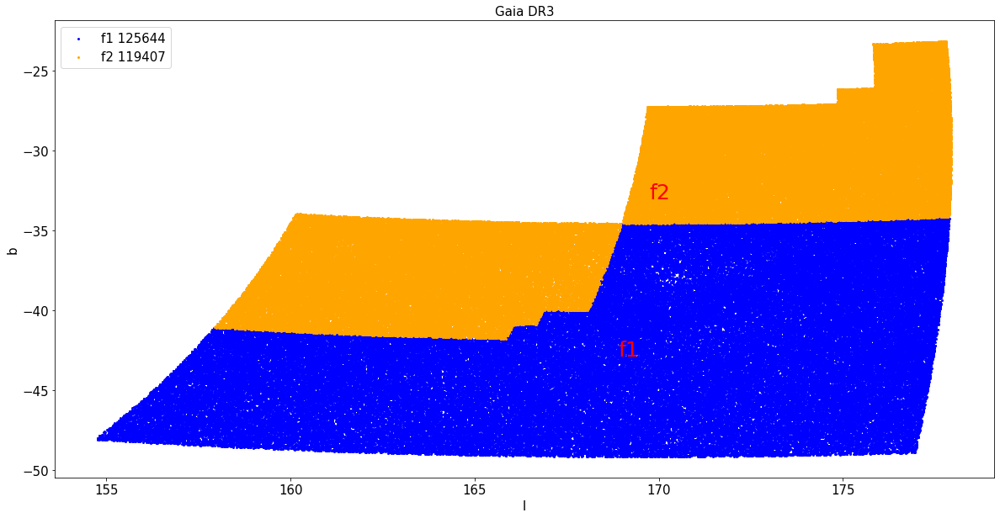

In [10]:

import matplotlib.pyplot as plt

fig = plt.figure(figsize=(20, 10))

plt.subplot(111)
image1 = plt.scatter(f1['l'], f1['b'], label="f1 " + str(f1.shape[0]), marker='.', linewidth=0,
            c='blue',edgecolor='k',cmap="jet_r")
image2 = plt.scatter(f2['l'], f2['b'], label="f2 " + str(f2.shape[0]), marker='.', linewidth=0,
            c='orange',edgecolor='k',cmap="jet_r")

ax = plt.gca()

plt.xlabel('l', fontsize=15)
plt.ylabel('b', fontsize=15)
plt.xticks(size = 15)
plt.yticks(size = 15)

plt.title('Gaia DR3', fontsize=15)
plt.legend(fontsize=15)
plt.text(f1['l'].mean(), f1['b'].mean(), "f1", fontsize=25, color="red")
plt.text(f2['l'].mean(), f2['b'].mean(), "f2", fontsize=25, color="red")
plt.show()

In [11]:
df = pd.concat([f1, f2], ignore_index=True, sort=False)
print("df: " + str(df.shape[0]))

df_OB = df[(df['spectraltype_esphs'] == "O") | (df['spectraltype_esphs'] == "B")] 
print("df_OB: " + str(df_OB.shape[0]))

df: 245051
df_OB: 1442


In [12]:
df_all = pd.concat([
       f1, f2], ignore_index=True, sort=False)
df_all.shape[0]

245051

In [13]:
df1 = df_all

#df1 = df_OB

df1.shape[0]

245051

In [14]:
import numpy as np
import scipy as sp
import starcolorindexSpT 

df1['SpT2'] = df1.apply(lambda row: starcolorindexSpT.subclass[round(row.bp_rp, 2)], axis=1)

df1['SpT2_dereddened'] = df1.apply(lambda row: starcolorindexSpT.subclass[round((row.bp_rp - row.ebpminrp_gspphot), 2)], axis=1)

In [15]:
import numpy as np

conditions = [
    (df1['logg_gspphot'].astype(float) > 4.20),
    ((df1['logg_gspphot'].astype(float) <= 4.20) & (df1['logg_gspphot'].astype(float) > 3.90)),
    ((df1['logg_gspphot'].astype(float) <= 3.90) & (df1['logg_gspphot'].astype(float) > 3.60)),
    ((df1['logg_gspphot'].astype(float) < 2.55) & (df1['logg_gspphot'].astype(float) > 2.35)),
    (df1['logg_gspphot'].astype(float) <= 3.60),
    (df1['logg_gspphot'].isna())
]

values = ['main_sequence', 'turnoff', 'subgiants', 'red_clump', 'red_giants', 'null']

df1['Star_Type'] = np.select(conditions, values)

In [16]:
import scipy as sp

unique_star_type = sp.unique(df1['Star_Type'].astype(str))

for i in unique_star_type:
    print(str(i) + ": " + str(df1[df1['Star_Type'] == i].shape[0]))

main_sequence: 191007
null: 16738
red_clump: 465
red_giants: 7246
subgiants: 6536
turnoff: 23059


In [17]:
df1['evolstage_flame'] = df1['evolstage_flame'].fillna(0)

conditions = [
    ((df1['evolstage_flame'].astype(int) >= 100) &  (df1['evolstage_flame'].astype(int) < 300)),
    ((df1['evolstage_flame'].astype(int) >= 300) &  (df1['evolstage_flame'].astype(int) < 360)),
    ((df1['evolstage_flame'].astype(int) >= 360) &  (df1['evolstage_flame'].astype(int) < 420)),
    ((df1['evolstage_flame'].astype(int) >= 420) &  (df1['evolstage_flame'].astype(int) < 490)),
    ((df1['evolstage_flame'].astype(int) >= 490) &  (df1['evolstage_flame'].astype(int) < 860)),
    ((df1['evolstage_flame'].astype(int) >= 860) &  (df1['evolstage_flame'].astype(int) < 890)),
    ((df1['evolstage_flame'].astype(int) >= 890) &  (df1['evolstage_flame'].astype(int) < 1290)),
    (df1['evolstage_flame'].astype(int) >= 1290),
    (df1['evolstage_flame'].astype(int) == 0),
]

values = ['(100-300) zero age main sequence                  ', 
          '(300-360) first minimum of Teff for massive stars ', 
          '(360-420) main sequence turn-off                  ', 
          '(420-490) central hydrogen mass fraction = 0.0    ', 
          '(490-860) base of the red giant brach (RGB)       ',
          '(860-890) maximun L along the RGB bump            ',
          '(890-1290) minimum L along the RGB bump           ',
          '(1290-1390) tip the RGB                           ',
          'NA                                                ']

df1['evolstage_type'] = np.select(conditions, values)

In [18]:
unique_evolstage_type = sp.unique(df1['evolstage_type'].astype(str))

for i in unique_evolstage_type:
    print(str(i) + ": " + str(df1[df1['evolstage_type'] == i].shape[0]))

(100-300) zero age main sequence                  : 60546
(1290-1390) tip the RGB                           : 1
(300-360) first minimum of Teff for massive stars : 54462
(360-420) main sequence turn-off                  : 41541
(420-490) central hydrogen mass fraction = 0.0    : 17739
(490-860) base of the red giant brach (RGB)       : 7960
(860-890) maximun L along the RGB bump            : 79
(890-1290) minimum L along the RGB bump           : 142
NA                                                : 62581


In [19]:
unique_classlabel = sp.unique(df1['classlabel_espels'].astype(str))

for i in unique_classlabel:
    print(str(i) + ": " + str(df1[df1['classlabel_espels'] == i].shape[0]))

RedDwarfEmStar: 3
TTauri: 23
beStar: 2
nan: 0


In [23]:
df_HerbigStar = df1[df1['classlabel_espels'] == "HerbigStar"]
df_PlanetaryNebula = df1[df1['classlabel_espels'] == "PlanetaryNebula"]
df_RedDwarfEmStar = df1[df1['classlabel_espels'] == "RedDwarfEmStar"]
df_TTauri = df1[df1['classlabel_espels'] == "TTauri"]
df_beStar = df1[df1['classlabel_espels'] == "beStar"]
df_wN = df1[df1['classlabel_espels'] == "wN"]

idx = 1000

df_O = df1[df1['spectraltype_esphs'] == "O"][0:idx]
df_B = df1[df1['spectraltype_esphs'] == "B"][0:idx]
df_A = df1[df1['spectraltype_esphs'] == "A"][0:idx]
df_F = df1[df1['spectraltype_esphs'] == "F"][0:idx]
df_G = df1[df1['spectraltype_esphs'] == "G"][0:idx]
df_K = df1[df1['spectraltype_esphs'] == "K"][0:idx]
df_M = df1[df1['spectraltype_esphs'] == "M"][0:idx]

df_CSTAR = df1[df1['spectraltype_esphs'] == "CSTAR"][0:idx]

In [41]:

#target = df_RedDwarfEmStar
#target = df_TTauri
#target = df_beStar

#target = df_O[0:25]
#target = df_B[0:25]
target = df_A[0:25]
#target = df_F[0:25]
#target = df_G[0:25]
#target = df_K[0:25]
#target = df_M[0:25]

#target = df_CSTAR[0:25]

results = target['source_id'].values.tolist()

In [31]:
# Plotter ==============================================
def make_canvas(xlabel = '', ylabel = '', fontsize = 12):
    #plt.xlabel(xlabel,  fontsize = fontsize)
    plt.xlabel("Wavelength [Angstroms]",  fontsize = fontsize)
    plt.ylabel(ylabel, fontsize = fontsize)
    plt.xticks(fontsize = fontsize)
    plt.yticks(fontsize = fontsize)
    plt.grid()

    plt.xticks([3839, 3889, 3970, 4101, 4340, 4472, 4861, 5175, 5270, 5411, 5755, 5895, 6302,
               6365, 6562, 6562, 6890, 7135, 7500, 7775, 8000, 8498, 8542, 8662, 9000, 9200])
    
    xLabels = (3839, 3889, 3970, 4101, 4340, 4472, 4861, 5175, 5270, 5411, 5755, 5895, 6302,
               6365, 6562, 6562, 6890, 7135, 7500, 7775, 8000, 8498, 8542, 8662, 9000, 9200)

    plt.xticks(xLabels, rotation=90)

    plt.xticks([3839, 3889, 3970, 4101, 4340, 4472, 4861, 5175, 5270, 5411, 5755, 5895, 6302,
               6365, 6562, 6562, 6890, 7135, 7500, 7775, 8000, 8498, 8542, 8662, 9000, 9200])
    
    xLabels = (3839, 3889, 3970, 4101, 4340, 4472, 4861, 5175, 5270, 5411, 5755, 5895, 6302,
               6365, 6562, 6562, 6890, 7135, 7500, 7775, 8000, 8498, 8542, 8662, 9000, 9200)

    plt.xticks(xLabels, rotation=90)

    yMin = float(xp['flux'].min())
    #yRangeMin = yMin + 0.2
    yRangeMin = 0.8 

    yRangeMax = float(xp['flux'].max())
    yRange = yRangeMax

    plt.annotate('CN 3839', xy=[3839,   yRangeMin + 0.6],  rotation=-90)
    plt.annotate('H-zeta 3889', xy=[3889, yRangeMin +  .20],  rotation=-90, color='red')
    plt.annotate('H-epsilon 3970', xy=[3970, yRangeMin +  0.6],  rotation=-90, color='red')
    plt.annotate('H-delta 4101', xy=[4101, yRangeMin +  .20],  rotation=-90, color='red')
    plt.annotate('H-gamma 4340', xy=[4340, yRangeMin + .20],  rotation=-90, color='red')
    plt.annotate('He I 4471.7', xy=[4472, yRangeMin + .20],  rotation=-90, color='orange')
    plt.annotate('H-beta 4861', xy=[4861, yRangeMin + .20],  rotation=-90, color='red')
    plt.annotate('Mg I 5175', xy=[5175, yRangeMin + .20],  rotation=-90)
    plt.annotate('Fe I 5270', xy=[5270, yRangeMin +  .20],  rotation=-90)
    plt.annotate('He II 5411', xy=[5411, yRangeMin +  .20],  rotation=-90, color='orange')
    plt.annotate('N II 5755', xy=[5755, yRangeMin +  .20],  rotation=-90)
    plt.annotate('D1 Na I 5895', xy=[5895, yRangeMin +  .20],  rotation=-90, color='blue')
    plt.annotate('OI 6302', xy=[6302, yRangeMin +  .20],  rotation=-90, color='green')
    plt.annotate('OI 6365.5', xy=[6365, yRangeMin +  .20],  rotation=-90, color='green')
    plt.annotate('H-alpha 6562', xy=[6562, yRangeMin +  .20],  rotation=-90, color='red')
    plt.annotate('CN 6890', xy=[6890, yRangeMin +  .20],  rotation=-90)
    plt.annotate('Ar III 7135', xy=[7135, yRangeMin +  .20],  rotation=-90)
    plt.annotate('O I 7775', xy=[7775, yRangeMin +  .20], rotation=-90, color='green')
    plt.annotate('Ca II 8498', xy=[8498, yRangeMin +  .35],  rotation=-90, color='blue')
    plt.annotate('Ca II 8542', xy=[8542, yRangeMin +  .30], rotation=-90, color='blue')
    plt.annotate('Ca II 8662.1', xy=[8662, yRangeMin +  .30],  rotation=-90, color='blue')

    """plt.annotate('CN 3839', xy=[3839,  yRange * 0.6],  rotation=-90)
    plt.annotate('H-zeta 3889', xy=[3889, yRange * .20],  rotation=-90, color='red')
    plt.annotate('H-epsilon 3970', xy=[3970, yRange * 0.6],  rotation=-90, color='red')
    plt.annotate('H-delta 4101', xy=[4101, yRange * .20],  rotation=-90, color='red')
    plt.annotate('H-gamma 4340', xy=[4340, yRange * .20],  rotation=-90, color='red')
    plt.annotate('He I 4471.7', xy=[4472, yRange * .20],  rotation=-90, color='orange')
    plt.annotate('H-beta 4861', xy=[4861, yRange * .20],  rotation=-90, color='red')
    plt.annotate('Mg I 5175', xy=[5175, yRange * .20],  rotation=-90)
    plt.annotate('Fe I 5270', xy=[5270, yRange * .20],  rotation=-90)
    plt.annotate('He II 5411', xy=[5411, yRange * .20],  rotation=-90, color='orange')
    plt.annotate('N II 5755', xy=[5755, yRange * .20],  rotation=-90)
    plt.annotate('D1 Na I 5895', xy=[5895, yRange * .20],  rotation=-90, color='blue')
    plt.annotate('OI 6302', xy=[6302, yRange * .20],  rotation=-90, color='green')
    plt.annotate('OI 6365.5', xy=[6365, yRange * .20],  rotation=-90, color='green')
    plt.annotate('H-alpha 6562', xy=[6562, yRange * .20],  rotation=-90, color='red')
    plt.annotate('CN 6890', xy=[6890, yRange * .20],  rotation=-90)
    plt.annotate('Ar III 7135', xy=[7135, yRange * .20],  rotation=-90)
    plt.annotate('O I 7775', xy=[7775, yRange * .20], rotation=-90, color='green')
    plt.annotate('Ca II 8498', xy=[8498, yRange * .35],  rotation=-90, color='blue')
    plt.annotate('Ca II 8542', xy=[8542, yRange * .30], rotation=-90, color='blue')
    plt.annotate('Ca II 8662.1', xy=[8662, yRange * .30],  rotation=-90, color='blue')""";

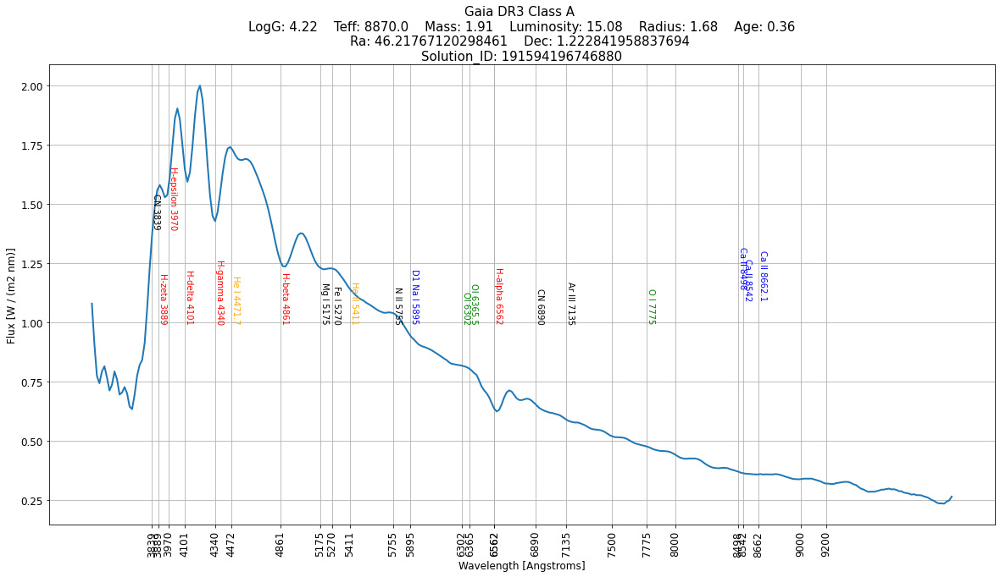

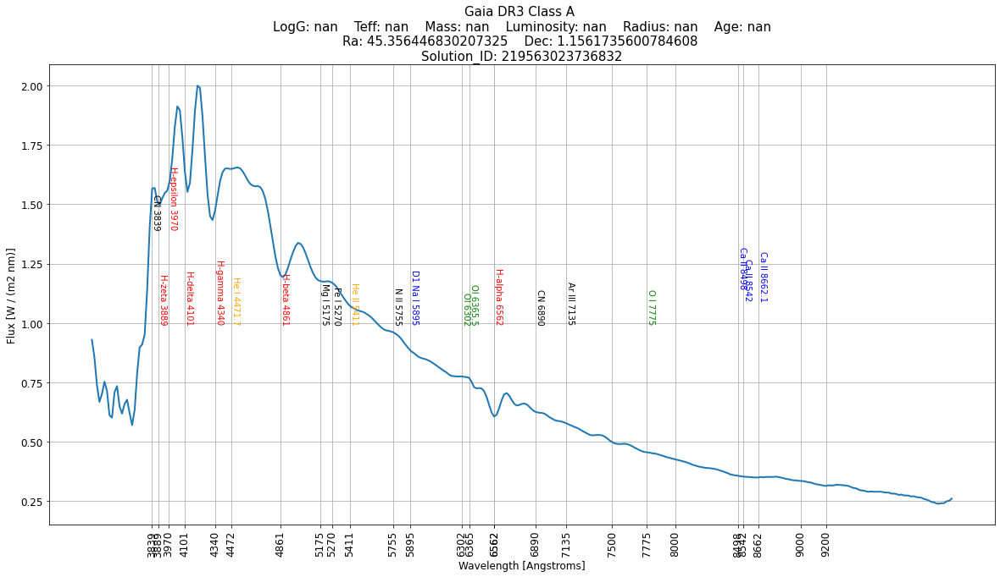

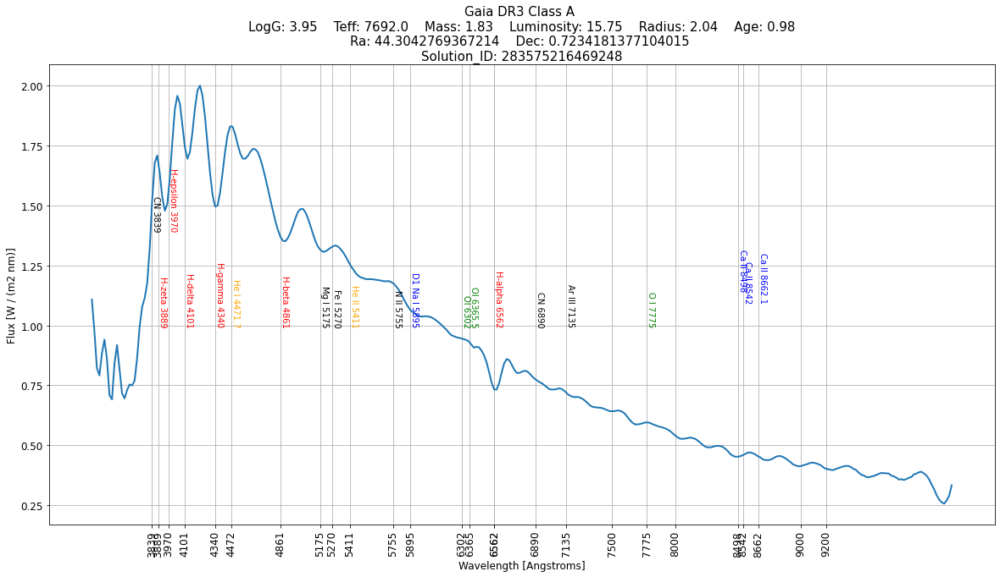

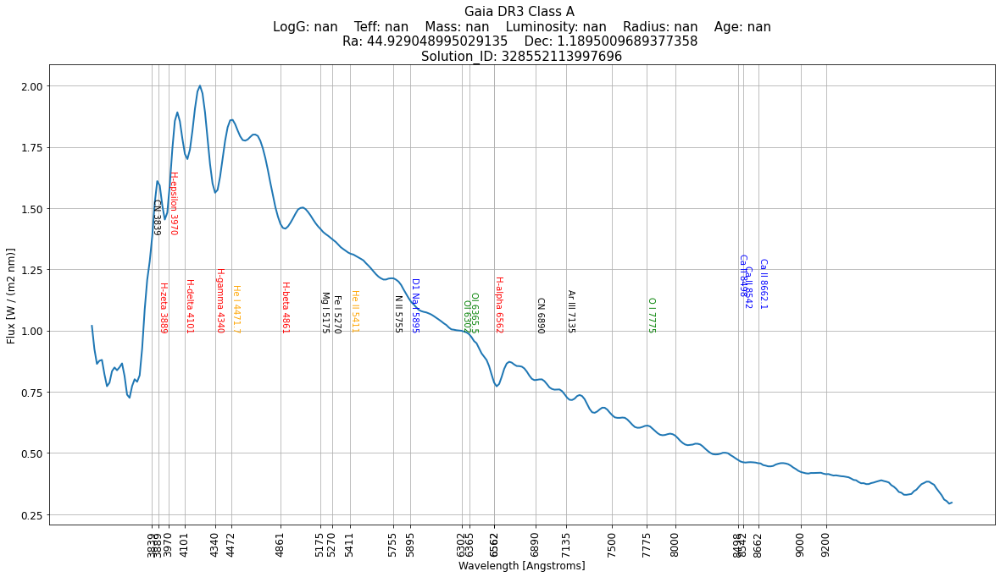

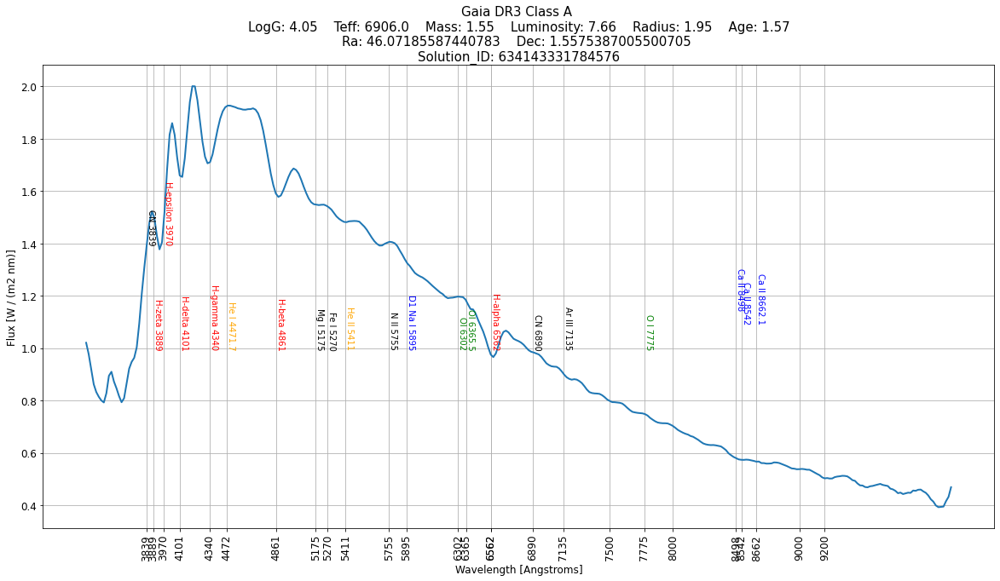

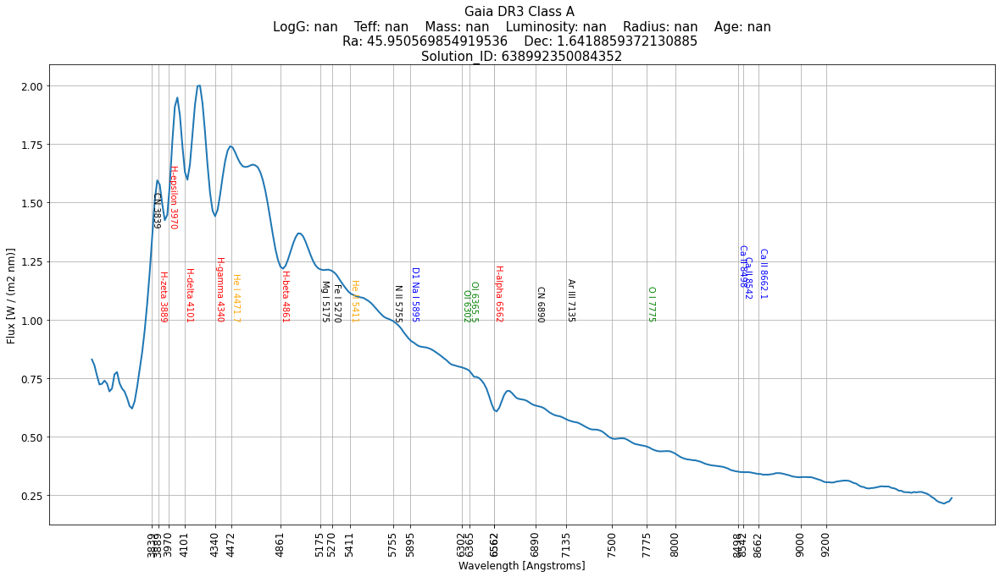

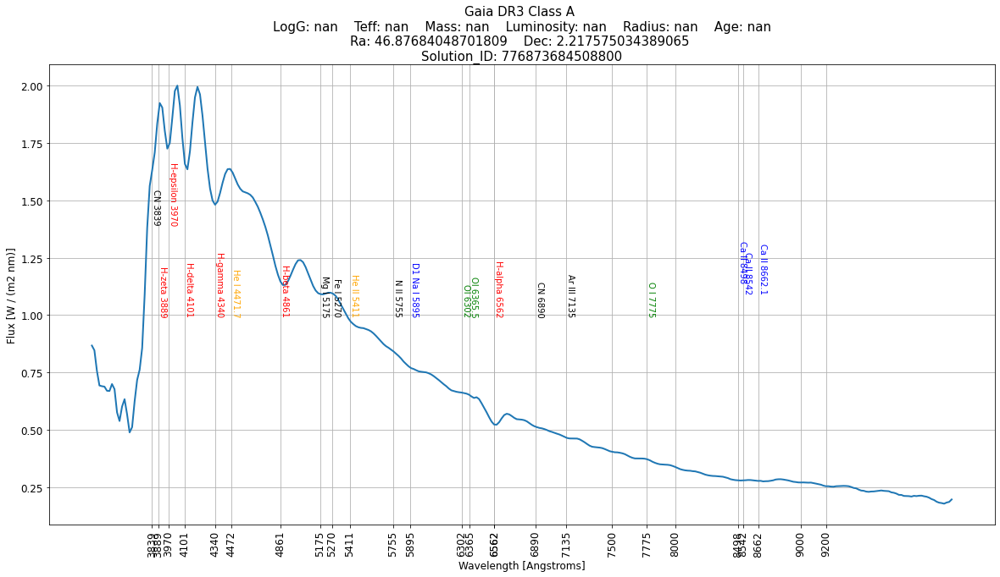

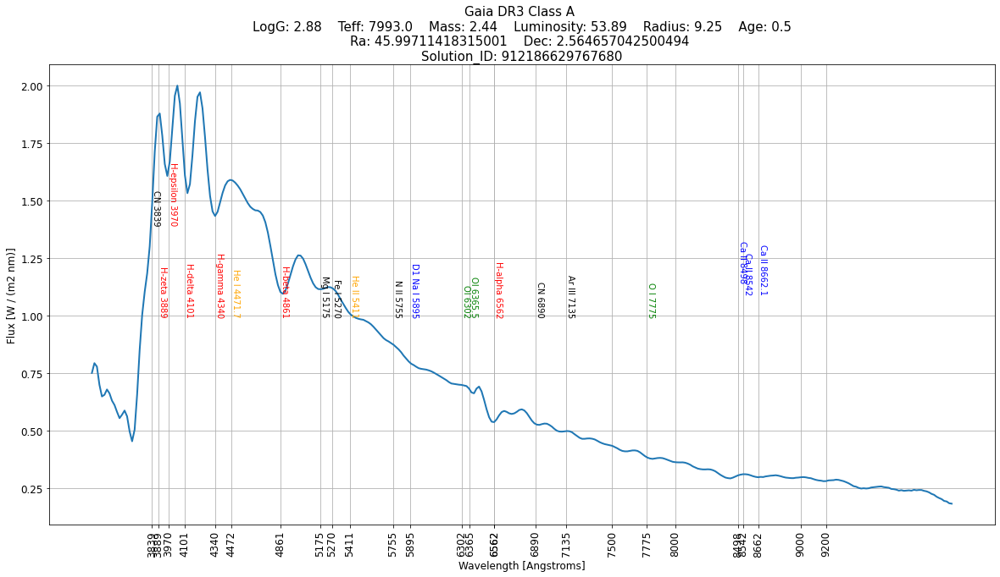


Done!


In [32]:
from astroquery.gaia import Gaia
import astropy.units as u
import matplotlib.pyplot as plt

for idx in range(0, len(results)):
    datalink = Gaia.load_data(results[idx], data_structure = 'INDIVIDUAL', retrieval_type = 'XP_SAMPLED')
    outputs = [datalink[key][0] for key in datalink.keys()]

    #print(str(results[idx]) + " Number of stars with XP Spectra: " + str(len(outputs)))

    if len(outputs) > 0:
        xp      = outputs[0].to_table()                      

        # Add flux-density columns ============================
        xp['flux_jy']         = xp['flux'].to(u.Jansky, equivalencies = u.spectral_density(xp['wavelength'].value * xp['wavelength'].unit))
        xp['flux_mjy']        = xp['flux_jy'].to(u.millijansky)
        xp['flux_mjy'].format = '7.4f'
        #display(xp)

        fig       = plt.figure(figsize=[20,10])

        yRangeMax = float(xp['flux'].max())

        plt.plot(xp['wavelength']*10, xp['flux']/yRangeMax * 2, linewidth = 2) 
        plt.title('Gaia DR3 Class '+ str(target['spectraltype_esphs'].iloc[idx]) + 
        ' \nLogG: ' + str(round(target['logg_gspphot'].iloc[idx], 2)) + 
        '    Teff: ' + str(round(target['teff_gspphot'].iloc[idx],0)) +
        '    Mass: ' + str(round(target['mass_flame'].iloc[idx],2)) +
        '    Luminosity: ' + str(round(target['lum_flame'].iloc[idx],2)) +
        '    Radius: ' + str(round(target['radius_gspphot'].iloc[idx],2)) +
        '    Age: ' + str(round(target['age_flame'].iloc[idx],2)) +
        '\nRa: ' + str(target['ra'].iloc[idx]) + "    Dec: " + str(target['dec'].iloc[idx]) +
        ' \nSolution_ID: ' + str(target['source_id'].iloc[idx]), fontsize=15)

        make_canvas(xlabel = f"Wavelength [{xp['wavelength'].unit}]", ylabel = f"Flux [{xp['flux'].unit}]", fontsize = 12)

        plt.show()

print("\nDone!")

In [33]:
df0 = pd.concat([df_HerbigStar, df_RedDwarfEmStar, df_TTauri, df_beStar, df_wN], ignore_index=True, sort=False)
df0.shape[0]

28

In [35]:

def plotly_classlabel(r1, x1, target1, title1):
    fig2 = px.scatter(r1, x='ra', y='dec', hover_data=[x1,'source_id','ra','dec','teff_gspphot','logg_gspphot','mh_gspphot',
                     'distance_gspphot','radius_gspphot','spectraltype_esphs', 'classlabel_espels','Star_Type',
                     'lum_flame','mass_flame', 'age_flame', 'evolstage_flame', 'bp_rp', 'ebpminrp_gspphot'], 
    color=x1, color_continuous_scale='jet',opacity=0.5,
    title=str(target1)+": " + str(title1))
    #fig2['layout']['xaxis']['autorange']= "reversed"
    #fig2['layout']['yaxis']['autorange']= "reversed"
    fig2.update_traces(marker={'size': 7})
    fig2.show()

In [36]:
target1 = ""

plotly_classlabel(df0, 'classlabel_espels', target1, "Color = classlabel_espels")

In [37]:

target1 = ""

plotly_classlabel(df0, 'evolstage_type', target1, "Color = evolstage_type")

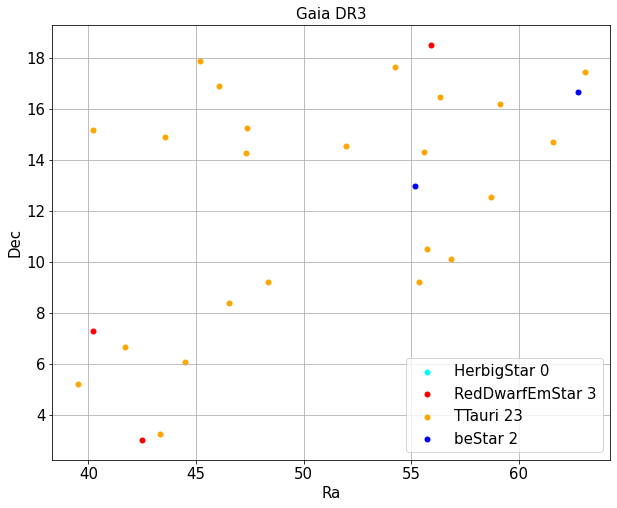

In [38]:
# reset rcParams
#plt.rcParams.update(Ipython_default)

fig = plt.figure(figsize=(10, 8))

plt.subplot(111)
image1 = plt.scatter(df_HerbigStar['ra'], df_HerbigStar['dec'], label="HerbigStar " + str(df_HerbigStar.shape[0]), marker='o', linewidth=0,
            c='aqua',edgecolor='k',cmap="jet_r")
image2 = plt.scatter(df_RedDwarfEmStar['ra'], df_RedDwarfEmStar['dec'], label="RedDwarfEmStar " + str(df_RedDwarfEmStar.shape[0]), marker='o', linewidth=0,
            c='red',edgecolor='k',cmap="jet_r")
image3 = plt.scatter(df_TTauri['ra'], df_TTauri['dec'], label="TTauri " + str(df_TTauri.shape[0]), marker='o', linewidth=0,
            c='orange',edgecolor='k',cmap="jet_r")
image4 = plt.scatter(df_beStar['ra'], df_beStar['dec'], label="beStar " + str(df_beStar.shape[0]), marker='o', linewidth=0,
            c='blue',edgecolor='k',cmap="jet_r")
ax = plt.gca()
#plt.gca().invert_yaxis()
plt.xlabel('Ra', fontsize=15)
plt.ylabel('Dec', fontsize=15)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title('Gaia DR3', fontsize=15)
plt.legend(fontsize=15)
plt.show()

In [39]:
print(df1.shape[0])

print("\n< Not Null >\n")

print("Alpha/Fe: " +str(df1[df1['alphafe_gspspec'].notna()].shape[0]))
print("Fe/M: " +str(df1[df1['fem_gspspec'].notna()].shape[0]))
print("Si/Fe: " +str(df1[df1['sife_gspspec'].notna()].shape[0]))
print("Ca/Fe: " +str(df1[df1['cafe_gspspec'].notna()].shape[0]))
print("Ti/Fe: " +str(df1[df1['tife_gspspec'].notna()].shape[0]))
print("Mg/Fe: " +str(df1[df1['mgfe_gspspec'].notna()].shape[0]))
print("Nd/Fe: " +str(df1[df1['ndfe_gspspec'].notna()].shape[0]))
print("FeII/M: " +str(df1[df1['feiim_gspspec'].notna()].shape[0]))
print("S/Fe: " +str(df1[df1['sfe_gspspec'].notna()].shape[0]))
print("Zr/Fe: " +str(df1[df1['zrfe_gspspec'].notna()].shape[0]))
print("N/Fe:  " +str(df1[df1['nfe_gspspec'].notna()].shape[0]))
print("Cr/Fe: " +str(df1[df1['crfe_gspspec'].notna()].shape[0]))
print("Ce/Fe: " +str(df1[df1['cefe_gspspec'].notna()].shape[0]))
print("Ni/Fe: " +str(df1[df1['nife_gspspec'].notna()].shape[0]))

245051

< Not Null >

Alpha/Fe: 11079
Fe/M: 3632
Si/Fe: 1519
Ca/Fe: 4920
Ti/Fe: 1565
Mg/Fe: 1097
Nd/Fe: 66
FeII/M: 152
S/Fe: 411
Zr/Fe: 7
N/Fe:  987
Cr/Fe: 364
Ce/Fe: 127
Ni/Fe: 820


In [40]:
unique_spectraltype = sp.unique(df1['spectraltype_esphs'].astype(str))

for i in unique_spectraltype:
    print(str(i) + ": " + str(df1[df1['spectraltype_esphs'] == i].shape[0]))

A: 2194
B: 1190
CSTAR: 5
F: 64059
G: 50234
K: 107495
M: 19622
O: 252


In [ ]:
"""df_A = df1[df1['spectraltype_esphs'] == "A"]
df_B = df1[df1['spectraltype_esphs'] == "B"]
df_CSTAR = df1[df1['spectraltype_esphs'] == "CSTAR"]
df_F = df1[df1['spectraltype_esphs'] == "F"]
df_G = df1[df1['spectraltype_esphs'] == "G"]
df_K = df1[df1['spectraltype_esphs'] == "K"]
df_M = df1[df1['spectraltype_esphs'] == "M"]
df_O = df1[df1['spectraltype_esphs'] == "O"]""";

In [42]:
idx = 100

In [43]:
df_alpha_fe = df1[df1['alphafe_gspspec'].notna()][0:idx]
df_fe_m = df1[df1['fem_gspspec'].notna()][0:idx]
df_si_fe = df1[df1['sife_gspspec'].notna()][0:idx]
df_ca_fe = df1[df1['cafe_gspspec'].notna()][0:idx]
df_ti_fe = df1[df1['tife_gspspec'].notna()][0:idx]
df_mg_fe = df1[df1['mgfe_gspspec'].notna()][0:idx]
df_nd_fe = df1[df1['ndfe_gspspec'].notna()][0:idx]
df_feii_m = df1[df1['feiim_gspspec'].notna()][0:idx]
df_s_fe  = df1[df1['sfe_gspspec'].notna()][0:idx]
df_zr_fe = df1[df1['zrfe_gspspec'].notna()][0:idx]
df_n_fe  = df1[df1['nfe_gspspec'].notna()][0:idx]
df_cr_fe = df1[df1['crfe_gspspec'].notna()][0:idx]
df_ce_fe = df1[df1['cefe_gspspec'].notna()][0:idx]
df_ni_fe = df1[df1['nife_gspspec'].notna()][0:idx]

In [44]:

df_A = df1[df1['spectraltype_esphs'] == "A"][0:idx]
df_B = df1[df1['spectraltype_esphs'] == "B"][0:idx]
df_CSTAR = df1[df1['spectraltype_esphs'] == "CSTAR"][0:idx]
df_F = df1[df1['spectraltype_esphs'] == "F"][0:idx]
df_G = df1[df1['spectraltype_esphs'] == "G"][0:idx]
df_K = df1[df1['spectraltype_esphs'] == "K"][0:idx]
df_M = df1[df1['spectraltype_esphs'] == "M"][0:idx]
df_O = df1[df1['spectraltype_esphs'] == "O"][0:idx]

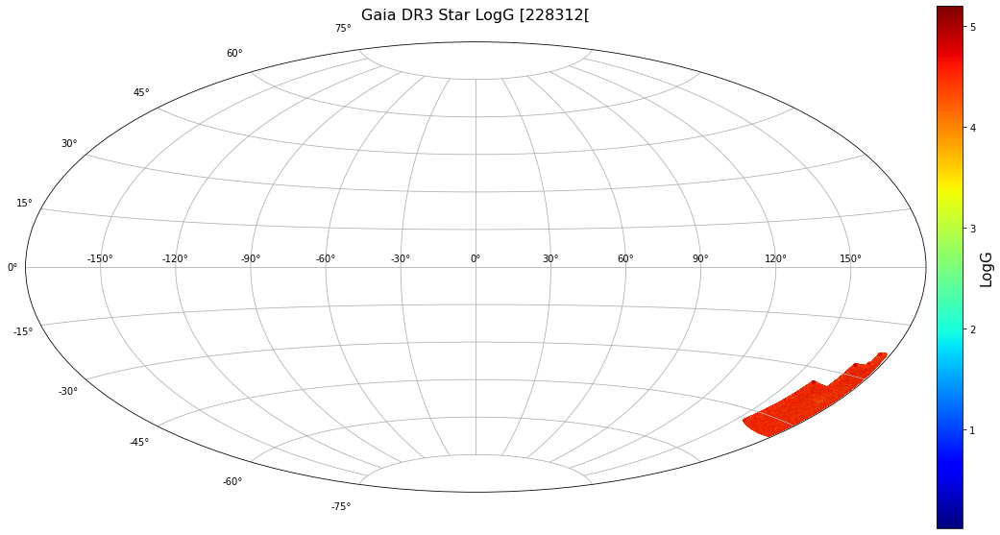

In [45]:
from astropy.coordinates import SkyCoord
import astropy.units as u

fx = df1[(df1.logg_gspphot > 0) & (df1.logg_gspphot < 10)]

eq = SkyCoord(fx.ra, fx.dec, unit=u.deg)
gal = eq.galactic

fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111,projection="aitoff")
image = ax.scatter(gal.l.wrap_at('180d').radian, gal.b.radian, c=fx.logg_gspphot, cmap="jet", marker='.')
bar = fig.colorbar(image,orientation="vertical",pad=0.01)
bar.set_label("LogG",size=15)
plt.title("Gaia DR3 Star LogG [" + str(fx.shape[0]) + "[\n", fontsize=16)
plt.grid()
fig.show()

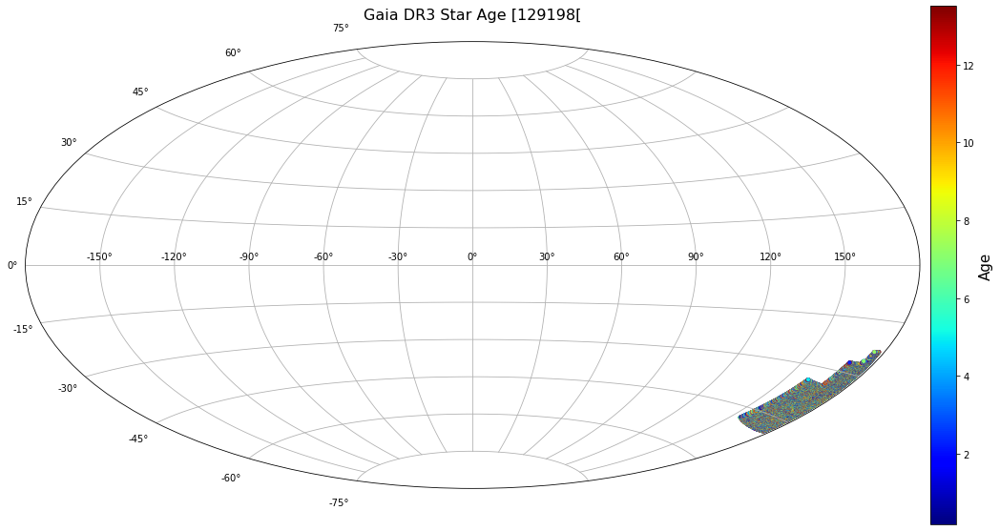

In [46]:
from astropy.coordinates import SkyCoord
import astropy.units as u

fx = df1[(df1.age_flame > 0) & (df1.age_flame < 14)]

eq = SkyCoord(fx.ra, fx.dec, unit=u.deg)
gal = eq.galactic

fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111,projection="aitoff")
image = ax.scatter(gal.l.wrap_at('180d').radian, gal.b.radian, c=fx.age_flame, cmap="jet", marker='.')
bar = fig.colorbar(image,orientation="vertical",pad=0.01)
bar.set_label("Age",size=15)
plt.title("Gaia DR3 Star Age [" + str(fx.shape[0]) + "[\n", fontsize=16)
plt.grid()
fig.show()

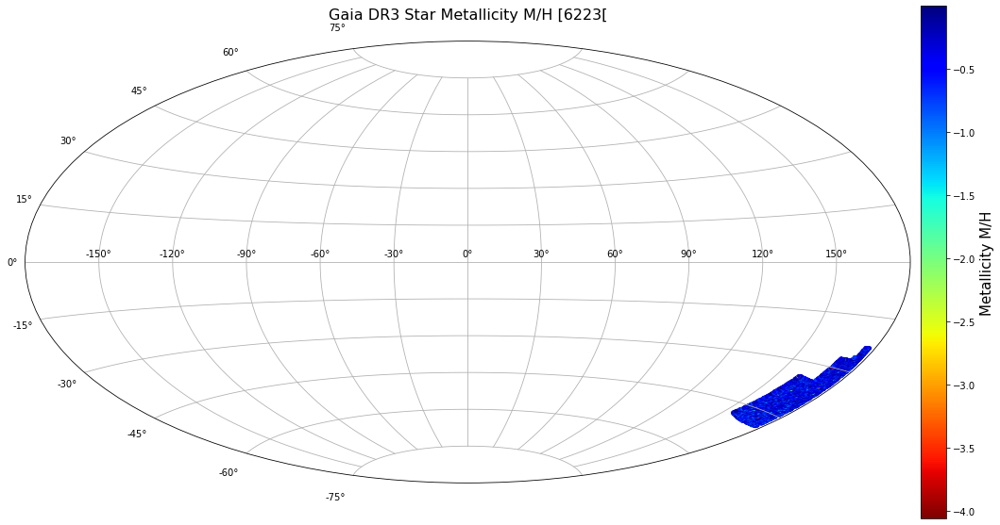

In [47]:
from astropy.coordinates import SkyCoord
import astropy.units as u

fx = df1[(df1['Star_Type'] == "subgiants") & (df1['mh_gspphot'] < 0)]
#fx = df1[df1['Star_Type'] == "red_giants"]

eq = SkyCoord(fx.ra, fx.dec, unit=u.deg)
gal = eq.galactic

fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111,projection="aitoff")
image = ax.scatter(gal.l.wrap_at('180d').radian, gal.b.radian, c=fx.mh_gspphot, cmap="jet_r", marker='.')
bar = fig.colorbar(image,orientation="vertical",pad=0.01)
bar.set_label("Metallicity M/H",size=15)
plt.title("Gaia DR3 Star Metallicity M/H [" + str(fx.shape[0]) + "[\n", fontsize=16)
plt.grid()
fig.show()

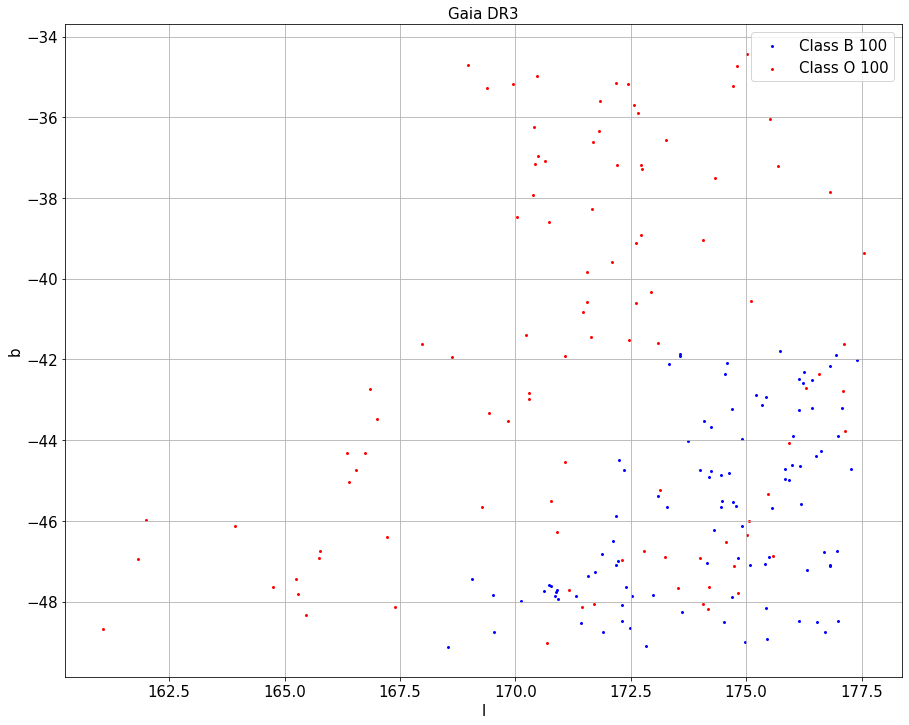

In [48]:

fig = plt.figure(figsize=(15, 12))

plt.subplot(111)
"""image1 = plt.scatter(df_A['l'], df_A['b'], label="Class A " + str(df_A.shape[0]), marker='.', linewidth=0,
            c='orange',edgecolor='k',cmap="jet_r")""";
image2 = plt.scatter(df_B['l'], df_B['b'], label="Class B " + str(df_B.shape[0]), marker='.', linewidth=0,
            c='blue',edgecolor='k',cmap="jet_r")
"""image3 = plt.scatter(df_F['l'], df_F['b'], label="Class F " + str(df_F.shape[0]), marker='.', linewidth=0,
            c='green',edgecolor='k',cmap="jet_r")
image4 = plt.scatter(df_G['l'], df_G['b'], label="Class G " + str(df_G.shape[0]), marker='.', linewidth=0,
            c='red',edgecolor='k',cmap="jet_r")
image5 = plt.scatter(df_K['l'], df_K['b'], label="Class K " + str(df_K.shape[0]), marker='.', linewidth=0,
            c='violet',edgecolor='k',cmap="jet_r")
image6 = plt.scatter(df_M['l'], df_M['b'], label="Class M " + str(df_M.shape[0]), marker='.', linewidth=0,
            c='aqua',edgecolor='k',cmap="jet_r")""";
image7 = plt.scatter(df_O['l'], df_O['b'], label="Class O " + str(df_O.shape[0]), marker='.', linewidth=0,
            c='red',edgecolor='k',cmap="jet_r")

ax = plt.gca()
#plt.gca().invert_yaxis()
plt.xlabel('l', fontsize=15)
plt.ylabel('b', fontsize=15)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title('Gaia DR3', fontsize=15)
plt.legend(fontsize=15)
plt.show()

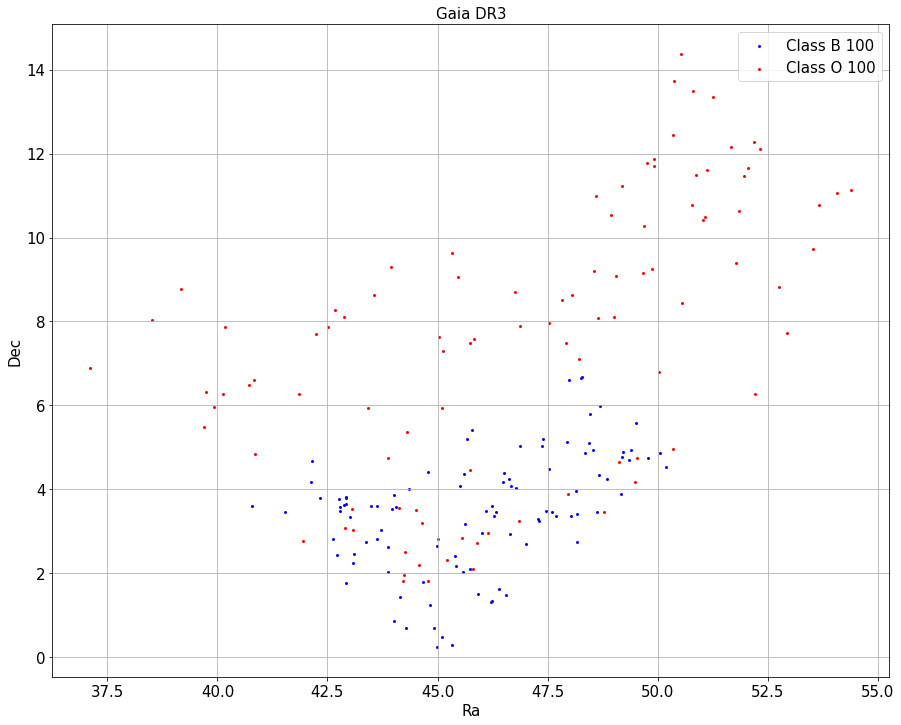

In [49]:

fig = plt.figure(figsize=(15, 12))

plt.subplot(111)
"""image1 = plt.scatter(df_A['ra'], df_A['dec'], label="Class A " + str(df_A.shape[0]), marker='.', linewidth=0,
            c='blue',edgecolor='k',cmap="jet_r")""";
image2 = plt.scatter(df_B['ra'], df_B['dec'], label="Class B " + str(df_B.shape[0]), marker='.', linewidth=0,
            c='blue',edgecolor='k',cmap="jet_r")
"""image3 = plt.scatter(df_F['ra'], df_F['dec'], label="Class F " + str(df_F.shape[0]), marker='.', linewidth=0,
            c='green',edgecolor='k',cmap="jet_r")
image4 = plt.scatter(df_G['ra'], df_G['dec'], label="Class G " + str(df_G.shape[0]), marker='.', linewidth=0,
            c='red',edgecolor='k',cmap="jet_r")
image5 = plt.scatter(df_K['ra'], df_K['dec'], label="Class K " + str(df_K.shape[0]), marker='.', linewidth=0,
            c='violet',edgecolor='k',cmap="jet_r")
image6 = plt.scatter(df_M['ra'], df_M['dec'], label="Class M " + str(df_M.shape[0]), marker='.', linewidth=0,
            c='aqua',edgecolor='k',cmap="jet_r")""";
image7 = plt.scatter(df_O['ra'], df_O['dec'], label="Class O " + str(df_O.shape[0]), marker='.', linewidth=0,
            c='red',edgecolor='k',cmap="jet_r")

ax = plt.gca()
#plt.gca().invert_yaxis()
plt.xlabel('Ra', fontsize=15)
plt.ylabel('Dec', fontsize=15)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.grid()
plt.title('Gaia DR3', fontsize=15)
plt.legend(fontsize=15)
plt.show()

In [51]:
r1 = df_all

r1.drop_duplicates()
r1.shape[0]

245051

In [52]:

print("\n< Not Null >\n")

print("Alpha/Fe: " +str(r1[r1['alphafe_gspspec'].notna()].shape[0]))
print("Fe/M: " +str(r1[r1['fem_gspspec'].notna()].shape[0]))
print("Si/Fe: " +str(r1[r1['sife_gspspec'].notna()].shape[0]))
print("Ca/Fe: " +str(r1[r1['cafe_gspspec'].notna()].shape[0]))
print("Ti/Fe: " +str(r1[r1['tife_gspspec'].notna()].shape[0]))
print("Mg/Fe: " +str(r1[r1['mgfe_gspspec'].notna()].shape[0]))
print("Nd/Fe: " +str(r1[r1['ndfe_gspspec'].notna()].shape[0]))
print("FeII/M: " +str(r1[r1['feiim_gspspec'].notna()].shape[0]))
print("S/Fe: " +str(r1[r1['sfe_gspspec'].notna()].shape[0]))
print("Zr/Fe: " +str(r1[r1['zrfe_gspspec'].notna()].shape[0]))
print("N/Fe:  " +str(r1[r1['nfe_gspspec'].notna()].shape[0]))
print("Cr/Fe: " +str(r1[r1['crfe_gspspec'].notna()].shape[0]))
print("Ce/Fe: " +str(r1[r1['cefe_gspspec'].notna()].shape[0]))
print("Ni/Fe: " +str(r1[r1['nife_gspspec'].notna()].shape[0]))


< Not Null >

Alpha/Fe: 11079
Fe/M: 3632
Si/Fe: 1519
Ca/Fe: 4920
Ti/Fe: 1565
Mg/Fe: 1097
Nd/Fe: 66
FeII/M: 152
S/Fe: 411
Zr/Fe: 7
N/Fe:  987
Cr/Fe: 364
Ce/Fe: 127
Ni/Fe: 820


In [53]:

r1.columns.sort_values().tolist()

['SpT2',
 'SpT2_dereddened',
 'Star_Type',
 'Unnamed: 0',
 'abp_gspphot',
 'ag_esphs',
 'ag_gspphot',
 'age_flame',
 'alphafe_gspspec',
 'arp_gspphot',
 'b',
 'bp_g',
 'bp_rp',
 'cafe_gspspec',
 'cefe_gspspec',
 'classlabel_espels',
 'crfe_gspspec',
 'dec',
 'distance_gspphot',
 'ebpminrp_esphs',
 'ebpminrp_gspphot',
 'ecl_lat',
 'ecl_lon',
 'evolstage_flame',
 'evolstage_type',
 'feiim_gspspec',
 'fem_gspspec',
 'g_rp',
 'gravredshift_flame',
 'l',
 'logg_esphs',
 'logg_gspphot',
 'logg_gspspec',
 'lum_flame',
 'mass_flame',
 'mg_gspphot',
 'mgfe_gspspec',
 'mh_gspphot',
 'mh_gspspec',
 'ndfe_gspspec',
 'nfe_gspspec',
 'nife_gspspec',
 'parallax',
 'phot_bp_mean_mag',
 'phot_g_mean_mag',
 'phot_rp_mean_mag',
 'pm',
 'pmdec',
 'pmra',
 'pseudocolour',
 'ra',
 'radial_velocity',
 'radius_flame',
 'radius_gspphot',
 'sfe_gspspec',
 'sife_gspspec',
 'source_id',
 'spectraltype_esphs',
 'teff_esphs',
 'teff_espucd',
 'teff_gspphot',
 'teff_gspspec',
 'tife_gspspec',
 'vsini_esphs',
 'zrfe_

In [54]:
target1 = ""

In [55]:
def AbundanceCategories(x1):
    main_sequence = x1[x1['logg_gspphot'].astype(float) > 4.20]
    turnoff       = x1[(x1['logg_gspphot'].astype(float) < 4.20) & (x1['logg_gspphot'].astype(float) > 3.90)]
    subgiants     = x1[(x1['logg_gspphot'].astype(float) < 3.90) & (x1['logg_gspphot'].astype(float) > 3.60)]
    red_giants    = x1[x1['logg_gspphot'].astype(float) < 3.60]
    
    print("main_sequence: " + str(main_sequence.shape[0]))
    print("turnoff: " + str(turnoff.shape[0]))
    print("subgiants: " + str(subgiants.shape[0]))
    print("red_giants: " + str(red_giants.shape[0]))

In [56]:
def plot00(r1):
    fdwarf = r1[r1['logg_gspphot'].astype(float) > 3.7]
    fmain_sequence = r1[r1['logg_gspphot'].astype(float) > 4.20]
    fturnoff       = r1[(r1['logg_gspphot'].astype(float) < 4.20) & (r1['logg_gspphot'].astype(float) > 3.90)]
    fsubgiants     = r1[(r1['logg_gspphot'].astype(float) < 3.90) & (r1['logg_gspphot'].astype(float) > 3.60)]
    fred_clump     = r1[(r1['logg_gspphot'].astype(float) < 2.55) & (r1['logg_gspphot'].astype(float) > 2.35)]
    fred_giants    = r1[r1['logg_gspphot'].astype(float) < 3.60]

    print("Field: " + str(target1))
    print("Stars: " + str(r1.shape[0]))
    print("\nmain_sequence: " + str(fmain_sequence.shape[0]))
    print("turnoff: " + str(fturnoff.shape[0]))
    print("subgiants: " + str(fsubgiants.shape[0]))
    print("red_clump: " + str(fred_clump.shape[0]))
    print("\nred_giants: " + str(fred_giants.shape[0] - fred_clump.shape[0]))
    print("dwarfs: " + str(fdwarf.shape[0]))

    print("\nAbundanceCategories:")
    AbundanceCategories(r1)

    print('\nSpectraltype: ' + str(sp.unique(r1['spectraltype_esphs'])))

    unique_spectraltype = sp.unique(r1['spectraltype_esphs'])

    for i in unique_spectraltype:
        print(str(i) + ": " + str(r1[r1['spectraltype_esphs'] == i].shape[0]))



In [57]:
def plot00A(r1):
    ## Checking for null values
    print(target1)
    print("\nNumber of stars: " + str(r1.shape[0]) + "\n")

    print("Sum of Null Values")

    print(pd.isnull(r1).sum())

In [58]:
def plot00B():
    ## Checking for not null values
    print(target1)
    print("\nNumber of stars: " + str(r1.shape[0]) + "\n")

    print("Sum of Not Null Values")

    print(pd.notnull(r1).sum())

In [59]:
def plot01(R_sun_limit):

    #R_sun_limit = 25000

    import matplotlib.pyplot as plt
    import seaborn as sns
    sns.set()

    rr0 = r1[r1.radius_gspphot> 0]
    rr1 = r1[r1.radius_gspphot < R_sun_limit]

    plt.style.use('dark_background')
    sns.relplot(x='bp_rp', y='mg_gspphot', height=8.5, aspect=1.2, legend=None, s=15, 
                hue='bp_rp',
                palette='RdYlBu_r',
                #size='radius_gspphot',
                #sizes=(1,rr1['radius_gspphot'].max()/rr1['radius_gspphot'].min()),
                data=rr1
                )
    plt.ylim(rr1['mg_gspphot'].max()+1, rr1['mg_gspphot'].min()-1)
    plt.xlabel('Color (bp - rp)', fontsize = 17)
    plt.ylabel('Absolute Magnitude', fontsize = 17)
    plt.title('Hertzsprung-Russel Diagram of ' + str(target1) + '\nNumber of Stars: ' + str(rr1.shape[0]), 
            fontsize = 17)

    plt.show()

In [60]:
def plot01B(r1):
    fdwarf = r1[r1['logg_gspphot'].astype(float) > 3.7]
    fmain_sequence = r1[r1['logg_gspphot'].astype(float) > 4.20]
    fturnoff       = r1[(r1['logg_gspphot'].astype(float) < 4.20) & (r1['logg_gspphot'].astype(float) > 3.90)]
    fsubgiants     = r1[(r1['logg_gspphot'].astype(float) < 3.90) & (r1['logg_gspphot'].astype(float) > 3.60)]
    fred_clump     = r1[(r1['logg_gspphot'].astype(float) < 2.55) & (r1['logg_gspphot'].astype(float) > 2.35)]
    fred_giants    = r1[r1['logg_gspphot'].astype(float) < 3.60]
    
    plt.style.use('dark_background')
    s1Label = "TEFF"
    fig = plt.figure(figsize=(10, 8))
    plt.subplot(111)
    #plt.scatter(fmain_sequence['bp_rp'], fmain_sequence['mg_gspphot'], label=('Main_sequence stars: ' + str(fmain_sequence.shape[0])), marker='o', linewidth=0,s=15,c='yellow')
    plt.scatter(fdwarf['bp_rp'], fdwarf['mg_gspphot'], label=('Dwarf stars: ' + str(fdwarf.shape[0])), marker='o', linewidth=0,s=15,c='yellow')
    plt.scatter(fturnoff['bp_rp'], fturnoff['mg_gspphot'], label=('Turnoff stars: ' + str(fturnoff.shape[0])), marker='o', linewidth=0,s=15,c='violet')
    plt.scatter(fsubgiants['bp_rp'], fsubgiants['mg_gspphot'], label=('Subgiants stars: ' + str(fsubgiants.shape[0])), marker='o', linewidth=0,s=15,c='g')
    plt.scatter(fred_clump ['bp_rp'], fred_clump ['mg_gspphot'], label=('Red Clump stars: ' + str(fred_clump .shape[0])), marker='o', linewidth=0,s=25,c='orange')
    plt.scatter(fred_giants['bp_rp'], fred_giants['mg_gspphot'], label=('Red Giant stars: ' + str(fred_giants.shape[0])), marker='o', linewidth=0,s=20,c='r')
    ax = plt.gca()
    plt.gca().invert_yaxis()
    plt.xlabel('BP_RP', fontsize=15)
    plt.ylabel('Absolute Magnitude', fontsize=15)
    plt.xticks(size = 15)
    plt.yticks(size = 15)
    plt.grid()
    plt.legend(fontsize=15)
    plt.title('Hertzsprung-Russel Diagram', fontsize=15)
    plt.show()

In [61]:
def plot02(R_sun_limit):

    #R_sun_limit = 25000


    rr0 = r1[r1.radius_gspphot > 0]
    rr1 = r1[r1.radius_gspphot < R_sun_limit]
    rr2 = rr1[rr1.parallax_over_error > 10]

    plt.style.use('dark_background')
    sns.relplot(x='bp_rp', y='mg_gspphot', 
                height=8.5, 
                aspect=1.2, 
                legend=None,
                hue='bp_rp',
                palette='RdYlBu_r',
                size='radius_gspphot',
                sizes=(1,rr2['radius_gspphot'].max()/rr2['radius_gspphot'].min()),
                data=rr2
                )
    plt.ylim(rr2['mg_gspphot'].max()+1, rr2['mg_gspphot'].min()-1)
    plt.xlabel('Color (bp - rp)', fontsize = 17)
    plt.ylabel('Absolute Magnitude', fontsize = 17)
    plt.title('Hertzsprung-Russel Diagram of ' + 
            str(target1) + "\nparallax_over_error > 10"
            + '\nNumber of Stars: ' + 
            str(rr2.shape[0]), 
            fontsize = 17)

    plt.show()

In [62]:
def plot03():
    s1Label = "TEFF"
    fig = plt.figure(figsize=(10, 8))
    plt.subplot(111)
    plt.scatter(r1['teff_gspphot'], r1['logg_gspphot'], marker='o', linewidth=0,s=15,
                c=r1.logg_gspphot,edgecolor='k',cmap="jet_r")
    ax = plt.gca()
    plt.gca().invert_xaxis()
    plt.gca().invert_yaxis()
    plt.xlabel('Teff', fontsize=15)
    plt.ylabel('LogG', fontsize=15)
    plt.xticks(size = 15)
    plt.yticks(size = 15)
    plt.grid()
    #plt.legend(fontsize=15)
    plt.title(str(target1) + '\nHertzsprung-Russel Diagram'  + '\nNumber of Stars: ' + str(r1.shape[0]), fontsize=15)
    plt.xlim([20000,3000])
    plt.grid()
    plt.show() 

In [63]:
def plotly_plots(r1, x1, target1, title1):
    #fig1 = px.histogram(r1, x=x1, title=str(target1)+": " + str(title1))
    #fig1.show();

    fig2 = px.scatter(r1, x='bp_rp', y='mg_gspphot', hover_data=[x1,'source_id','ra','dec','teff_gspphot','logg_gspphot','mh_gspphot',
                     'distance_gspphot','radius_gspphot','spectraltype_esphs', 'SpT2', 'SpT2_dereddened',
                     'lum_flame','mass_flame', 'age_flame', 'evolstage_flame','evolstage_type' ,'Star_Type', 'bp_rp', 'ebpminrp_gspphot'], 
    color=x1, color_continuous_scale='rdylbu', #opacity=0.5,
    title=str(target1)+": " + str(title1))
    #fig2['layout']['xaxis']['autorange']= "reversed"
    fig2['layout']['yaxis']['autorange']= "reversed"
    fig2.update_traces(marker={'size': 6})
    fig2.show()

In [64]:
def plotly_plots_reverse(r1, x1, target1, title1):
    #fig1 = px.histogram(r1, x=x1, title=str(target1)+": " + str(title1))
    #fig1.show();

    fig2 = px.scatter(r1, x='bp_rp', y='mg_gspphot', hover_data=[x1,'source_id','ra','dec','teff_gspphot','logg_gspphot','mh_gspphot',
                     'distance_gspphot','radius_gspphot','spectraltype_esphs', 'SpT2', 'SpT2_dereddened',
                     'lum_flame','mass_flame', 'age_flame', 'evolstage_flame','evolstage_type' ,'Star_Type', 'bp_rp', 'ebpminrp_gspphot'], 
    color=x1, color_continuous_scale='jet', #opacity=0.5,
    title=str(target1)+": " + str(title1))
    #fig2['layout']['xaxis']['autorange']= "reversed"
    fig2['layout']['yaxis']['autorange']= "reversed"
    fig2.update_traces(marker={'size': 5})
    fig2.show()

In [65]:
def plotly_plots2(r1, x1, target1, title1):
    #fig1 = px.histogram(r1, x=x1, title=str(target1)+": " + str(title1))
    #fig1.show();

    #r1['bp_rp_dereddened'] = []
    r1['bp_rp_dereddened'] = r1['bp_rp'] - r1['ebpminrp_gspphot']

    fig2 = px.scatter(r1, x='bp_rp_dereddened', y='mg_gspphot', hover_data=[x1,'source_id','ra','dec','teff_gspphot','logg_gspphot','mh_gspphot',
                     'distance_gspphot','radius_gspphot','spectraltype_esphs', 'SpT2', 'SpT2_dereddened',
                     'lum_flame','mass_flame', 'age_flame', 'evolstage_flame','evolstage_type' ,'Star_Type', 'bp_rp', 'ebpminrp_gspphot'], 
    color=x1, color_continuous_scale='rdylbu',
    title=str(target1)+": " + str(title1))
    #fig2['layout']['xaxis']['autorange']= "reversed"
    fig2['layout']['yaxis']['autorange']= "reversed"
    fig2.show()

In [66]:
# https://www.pas.rochester.edu/~emamajek/EEM_dwarf_UBVIJHK_colors_Teff.txt

unique_SpT2  = sp.unique(r1['SpT2'])

print("Star subclass based on BP_RP color\n")

for i in unique_SpT2 :
    print(str(i) + ": " + str(r1[r1['SpT2'] == i].shape[0]))

Star subclass based on BP_RP color

A0V: 22
A1V: 12
A2V: 19
A3V: 45
A4V: 12
A5V: 20
A6V: 28
A7V: 56
A8V: 13
A9V: 60
B2V: 1
B3V: 6
B4V: 3
B5V: 5
B6V: 16
B7V: 6
B8V: 9
B9.5V: 16
B9V: 2
F0V: 96
F1V: 131
F2V: 64
F3V: 95
F4V: 138
F5V: 272
F6V: 234
F7V: 221
F8V: 430
F9.5V: 400
F9V: 1411
G0V: 1117
G1V: 1480
G2V: 867
G3V: 956
G4V: 1082
G5V: 2664
G6V: 1432
G7V: 3393
G8V: 10381
G9V: 7419
K0V: 8011
K1V: 26849
K2V: 34451
K3V: 35171
K4V: 18604
K5V: 16444
K6V: 19897
K7V: 2716
K8V: 5003
K9V: 3770
L3V: 1
L8V: 2
M0.5V: 6310
M0V: 8348
M1.5V: 4082
M1V: 1840
M2.5V: 3380
M2V: 5557
M3.5V: 1923
M3V: 6407
M4.5V: 300
M4V: 1124
M5.5V: 39
M5V: 172
M6.5V: 2
M6V: 8
M7.5V: 2
M7V: 1
M8.5V: 1
M8V: 1
T4V: 1


In [67]:
# https://www.pas.rochester.edu/~emamajek/EEM_dwarf_UBVIJHK_colors_Teff.txt

unique_SpT2_dereddened  = sp.unique(r1['SpT2_dereddened'])

print("Star subclass based on BP_RP color minus reddening (ebpminrp_gspphot)\n")

for i in unique_SpT2_dereddened :
    print(str(i) + ": " + str(r1[r1['SpT2_dereddened'] == i].shape[0]))

Star subclass based on BP_RP color minus reddening (ebpminrp_gspphot)

A0V: 98
A1V: 88
A2V: 43
A3V: 58
A4V: 48
A5V: 54
A6V: 82
A7V: 113
A8V: 23
A9V: 208
B2V: 1
B3V: 5
B4V: 4
B5V: 11
B6V: 18
B7V: 5
B8V: 8
B9.5V: 40
B9V: 10
F0V: 361
F1V: 751
F2V: 422
F3V: 976
F4V: 1416
F5V: 2704
F6V: 2855
F7V: 2561
F8V: 4641
F9.5V: 2535
F9V: 10383
G0V: 5404
G1V: 5462
G2V: 2687
G3V: 3037
G4V: 3007
G5V: 5587
G6V: 3070
G7V: 6704
G8V: 16836
G9V: 10853
K0V: 10634
K1V: 26369
K2V: 23605
K3V: 19238
K4V: 12582
K5V: 10392
K6V: 9239
K7V: 1062
K8V: 2374
K9V: 2566
M0.5V: 3349
M0V: 5327
M1.5V: 2454
M1V: 1024
M2.5V: 1028
M2V: 2925
M3.5V: 86
M3V: 820
M4.5V: 22
M4V: 26
M5.5V: 1
M5V: 21
O3V: 16738


In [68]:
target1 = ""

Plot_00_flag  = "Y"       # Plot "Stats"
Plot_00A_flag = "N"       # Checking for null values
Plot_00B_flag = "N"       # Checking for not null values

Plot_01_flag  = "Y"       # Plot "BP_RP versus Absolute Magnitude"
Plot_02_flag  = "N"       # Plot "BP_RP versus Absolute Magnitude - parallax_over_error >10"
Plot_03_flag  = "Y"       # Plot "Teff versus LogG"

Plot_10_flag  = "NN"       # Plot "Color = teff_gspphot - BP_RP versus Absolute Magnitude"
Plot_11_flag  = "Y"       # Plot "Color = logg_gspphot - BP_RP versus Absolute Magnitude"
Plot_12_flag  = "Y"       # Plot "Color = mh_gspphot - BP_RP versus Absolute Magnitude"
Plot_13_flag  = "Y"       # Plot "Color = distance_gspphot - BP_RP versus Absolute Magnitude"

Plot_14_flag  = "NN"       # Plot "Color = ag_gspphot - BP_RP versus Absolute Magnitude"
Plot_15_flag  = "NN"       # Plot "Color = abp_gspphot - BP_RP versus Absolute Magnitude"

Plot_16_flag  = "Y"       # Plot "Color = radius_gspphot - BP_RP versus Absolute Magnitude"
Plot_17_flag  = "Y"       # Plot "Color = lum_flame - BP_RP versus Absolute Magnitude"
Plot_18_flag  = "Y"       # Plot "Color = mass_flame - BP_RP versus Absolute Magnitude"
Plot_19_flag  = "Y"       # Plot "Color = age_flame - BP_RP versus Absolute Magnitude"


Plot_029_flag  = "Y"      # Plot "Abundance of alpha-elements [alpha/Fe]"
Plot_029B_flag  = "N"     # Plot "Abundance of alpha-elements [alpha/Fe] dereddened"

Plot_030_flag  = "N"      # Plot "Abundance of neutral iron [Fe/M"
Plot_031_flag  = "N"      # Plot "Abundance of Silicon [Si/Fe]"
Plot_032_flag  = "N"      # Plot "Abundance of Calcium [Ca/Fe]"
Plot_033_flag  = "N"      # Plot "Abundance of Titanium [Ti/Fe]"       

Plot_034_flag  = "N"      # Plot "Abundance of Magnesium [Mg/Fe]"

Plot_035_flag  = "N"      # Plot "Abundance of neodymium [Nd/Fe]"
Plot_036_flag  = "N"      # Plot "Abundance of ionised iron [FeII/M]"

Plot_037_flag  = "N"      # Plot "Abundance of Sulphur [S/Fe]"

Plot_038_flag  = "N"      # Plot "Abundance of Zirconium [Zr/Fe]"
Plot_039_flag  = "N"      # Plot "Abundance of Nitrogen [N/Fe]]"
Plot_040_flag  = "N"      # Plot "Abundance of Chromium [Cr/Fe]"
Plot_041_flag  = "N"      # Plot "Abundance of Cerium [Ce/Fe]"
Plot_042_flag  = "N"      # Plot "Abundance of Nickel [Ni/Fe]"

In [72]:

r1 = df_all[0:3000]


Field: 
Stars: 3000

main_sequence: 2420
turnoff: 219
subgiants: 90
red_clump: 3

red_giants: 64
dwarfs: 2705

AbundanceCategories:
main_sequence: 2420
turnoff: 219
subgiants: 90
red_giants: 67

Spectraltype: ['A' 'B' 'F' 'G' 'K' 'M' 'O']
A: 17
B: 14
F: 689
G: 726
K: 1269
M: 284
O: 1


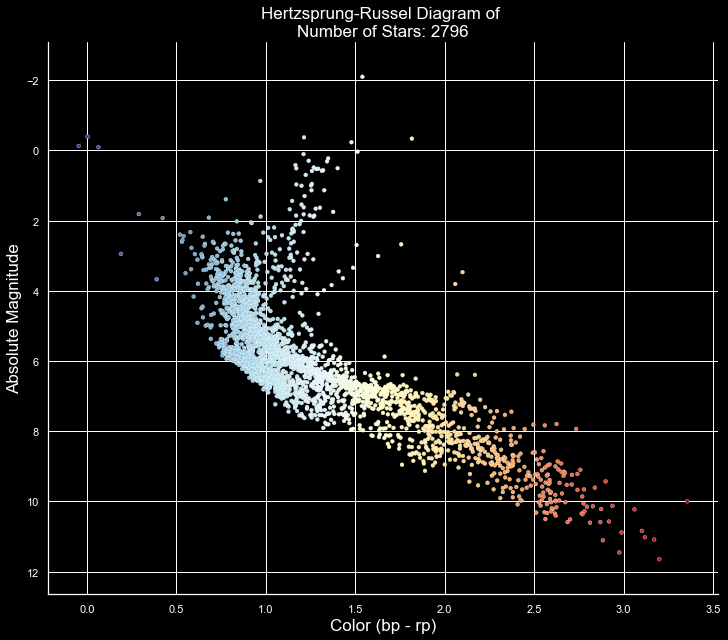

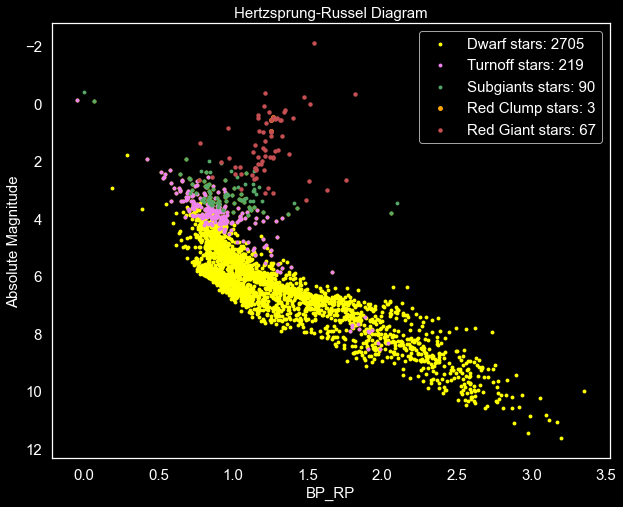

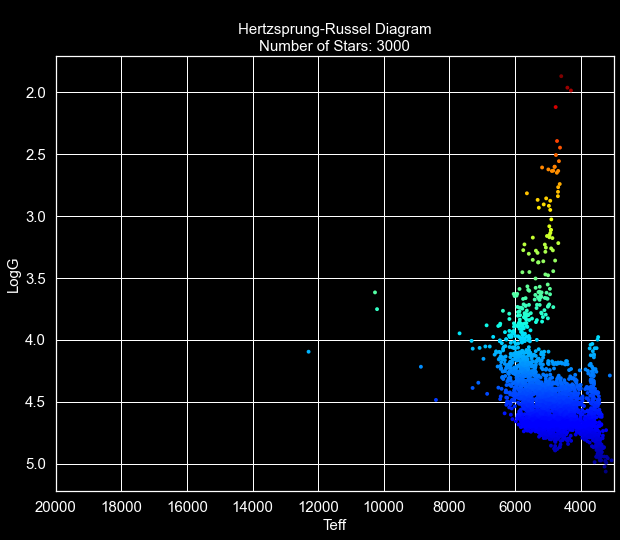

In [73]:

pd.options.display.max_columns = None
pd.set_option('display.max_rows', 2000)

if Plot_00_flag == "Y":
    plot00(r1)

if Plot_00A_flag == "Y":
    plot00A(r1)

if Plot_00B_flag == "Y":
    plot00B()

if Plot_01_flag == "Y":
    plot01(2500)
    plot01B(r1)

if Plot_02_flag == "Y":
    plot02(2500)

if Plot_03_flag == "Y":
    plot03()




if Plot_10_flag == "Y":
    plotly_plots(r1, 'teff_gspphot', target1, "Color = teff_gspphot - Effective Temperature")

if Plot_11_flag == "Y":
    plotly_plots(r1, 'logg_gspphot', target1, "Color = logg_gspphot - Surface Gravity")

if Plot_12_flag == "Y":
    plotly_plots(r1, 'mh_gspphot', target1, "Color = mh_gspphot - Iron Abundance")

if Plot_13_flag == "Y":
    plotly_plots_reverse(r1, 'distance_gspphot', target1, "Color = distance_gspphot - Distance (1pc - 100kpc")

if Plot_14_flag == "Y":
    plotly_plots(r1, 'ag_gspphot', target1, "Color = ag_gspphot - Extinction in G band")

if Plot_15_flag == "Y":
    plotly_plots(r1, 'abp_gspphot', target1, "Color = abp_gspphot - Broadband Extinction in Gbp band")

if Plot_16_flag == "Y":
    plotly_plots_reverse(r1, 'radius_gspphot', target1, "Color = radius_gspphot - Radius")

if Plot_17_flag == "Y":
    plotly_plots_reverse(r1, 'lum_flame', target1, "Color = lum_flame - Luminosity")

if Plot_18_flag == "Y":
    plotly_plots_reverse(r1, 'mass_flame', target1, "Color = mass_flame - Mass")

if Plot_19_flag == "Y":
    plotly_plots_reverse(r1, 'age_flame', target1, "Color = age_flame - Age")



if Plot_029_flag == "Y":
        #plotly_plots(r1, 'alphafe_gspspec', target1, "Abundance of alpha-elements [alpha/Fe]")
        plotly_plots(df_alpha_fe, 'alphafe_gspspec', target1, "Abundance of alpha-elements [alpha/Fe]  Stars: " + str(df_alpha_fe.shape[0]))

if Plot_029B_flag == "Y":
        #plotly_plots2(r1, 'alphafe_gspspec', target1, "Abundance of alpha-elements [alpha/Fe]")
        plotly_plots2(df_alpha_fe, 'alphafe_gspspec', target1, "Abundance of alpha-elements [alpha/Fe]  Stars: " + str(df_alpha_fe.shape[0]))

if Plot_030_flag == "Y":
        #plotly_plots(r1, 'fem_gspspec', target1, "Abundance of neutral iron [Fe/M")
        plotly_plots(df_fe_m, 'fem_gspspec', target1, "Abundance of neutral iron [Fe/M]]  Stars: " + str(df_fe_m.shape[0]))

if Plot_031_flag == "Y":
    #plotly_plots(r1, 'sife_gspspec', target1, "Abundance of Silicon [Si/Fe]")
    plotly_plots(df_si_fe, 'sife_gspspec', target1, "Abundance of Silicon [Si/Fe]  Stars: " + str(df_si_fe.shape[0]))

if Plot_032_flag == "Y":
    #plotly_plots(r1, 'cafe_gspspec', target1, "Abundance of Calcium [Ca/Fe]")
    plotly_plots(df_ca_fe, 'cafe_gspspec', target1, "Abundance of Calcium [Ca/Fe]  Stars: " + str(df_ca_fe.shape[0]))

if Plot_033_flag == "Y":
    #plotly_plots(r1, 'tife_gspspec', target1, "Abundance of Titanium [Ti/Fe]")
    plotly_plots(df_ti_fe, 'tife_gspspec', target1, "Abundance of Titanium [Ti/Fe]  Stars: " + str(df_ti_fe.shape[0]))

if Plot_034_flag == "Y":
    #plotly_plots(r1, 'mgfe_gspspec', target1, "Abundance of Magnesium [Mg/Fe]")
    plotly_plots(df_mg_fe, 'mgfe_gspspec', target1, "Abundance of Magnesium [Mg/Fe]  Stars: " + str(df_mg_fe.shape[0]))

if Plot_035_flag == "Y":
    #plotly_plots(r1, 'ndfe_gspspec', target1, "Abundance of Neodymium [Nd/Fe]")
    plotly_plots(df_nd_fe, 'ndfe_gspspec', target1, "Abundance of Neodymium [Nd/Fe]  Stars: " + str(df_nd_fe.shape[0]))

if Plot_036_flag == "Y":
    #plotly_plots(r1, 'feiim_gspspec', target1, "Abundance of ionised iron [FeII/M]")
    plotly_plots(df_feii_m, 'feiim_gspspec', target1, "Abundance of ionised iron [FeII/M]  Stars: " + str(df_feii_m.shape[0]))

if Plot_037_flag == "Y":
    #plotly_plots(r1, 'sfe_gspspec', target1, "Abundance of Sulphur [S/Fe]")
    plotly_plots(df_s_fe, 'sfe_gspspec', target1, "Abundance of Sulphur [S/Fe]  Stars: " + str(df_s_fe.shape[0]))

if Plot_038_flag == "Y":
    #plotly_plots(r1, 'zrfe_gspspec', target1, "Abundance of Zirconium [Zr/Fe]  Stars: " + str(df_zr_fe.shape[0]))
    plotly_plots(df_zr_fe, 'zrfe_gspspec', target1, "Abundance of Zirconium [Zr/Fe]  Stars: " + str(df_zr_fe.shape[0]))

if Plot_039_flag == "Y":
    #plotly_plots(r1, 'nfe_gspspec', target1, "Abundance of Nitrogen [N/Fe]]")
    plotly_plots(df_n_fe, 'nfe_gspspec', target1, "Abundance of Nitrogen [N/Fe]  Stars: " + str(df_n_fe.shape[0]))

if Plot_040_flag == "Y":
    #plotly_plots(r1, 'crfe_gspspec', target1, "Abundance of Chromium [Cr/Fe]")
    plotly_plots(df_cr_fe, 'crfe_gspspec', target1, "Abundance of Chromium [Cr/Fe]  Stars: " + str(df_cr_fe.shape[0]))

if Plot_041_flag == "Y":
   #plotly_plots(r1, 'cefe_gspspec', target1, "Abundance of Cerium [Ce/Fe]")
   plotly_plots(df_ce_fe, 'cefe_gspspec', target1, "Abundance of Cerium [Ce/Fe]  Stars: " + str(df_ce_fe.shape[0]))

if Plot_042_flag == "Y":
    #plotly_plots(r1, 'nife_gspspec', target1, "Abundance of Nickel [Ni/Fe]")
    plotly_plots(df_ni_fe, 'nife_gspspec', target1, "Abundance of Nickel [Ni/Fe]  Stars: " + str(df_ni_fe.shape[0]))

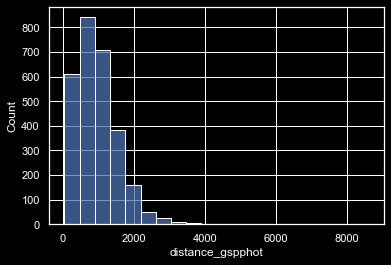

In [74]:
import seaborn as sns

df = r1[r1['distance_gspphot'] < 10000]
sns.histplot(data=df, x='distance_gspphot', bins=20);

In [75]:
r1.shape[0]

3000

In [83]:
df_OB = df1

In [84]:
# Class O star counts

df_OB_O = df_OB[df_OB['spectraltype_esphs'] == "O"]
print("Class O: " + str(df_OB_O.shape[0]))

Class O: 252


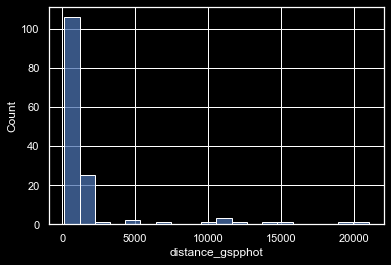

In [85]:
# Class O star distance (pc)

import seaborn as sns

sns.histplot(data=df_OB_O, x='distance_gspphot', bins=20);

In [86]:
# Class B star counts

df_OB_B = df_OB[df_OB['spectraltype_esphs'] == "B"]
print("Class B: " + str(df_OB_B.shape[0]))

Class B: 1190


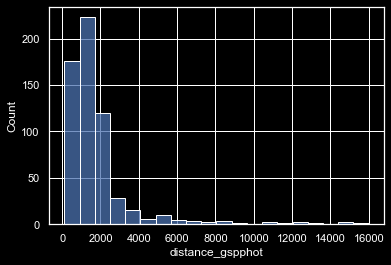

In [87]:
# Class B star distance (pc)

sns.histplot(data=df_OB_B, x='distance_gspphot', bins=20);

In [88]:
# Class OB star counts

print("Class B: " + str(df_OB.shape[0]))

Class B: 245051


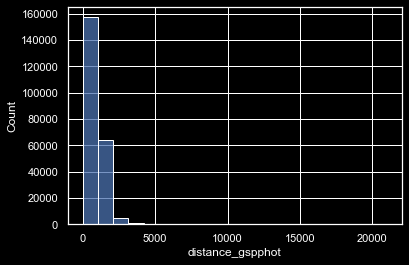

In [89]:
# Class OB star distance (pc)

sns.histplot(data=df_OB, x='distance_gspphot', bins=20);

In [90]:
import plotly.express as px

plotly_plots(df_OB_O, 'logg_gspphot',"Class O Stars " + str(df_OB_O.shape[0]), "Surface Gravity [logg_gspphot]")
plotly_plots(df_OB_B, 'logg_gspphot',"Class B Stars " + str(df_OB_B.shape[0]), "Surface Gravity [logg_gspphot]")


In [91]:
plotly_plots(df_OB_O, 'mh_gspphot',"Class O Stars " + str(df_OB_O.shape[0]), "Iron Abundance [mh_gspphot]")
plotly_plots(df_OB_B, 'mh_gspphot',"Class B Stars " + str(df_OB_B.shape[0]), "Iron Abundance [mh_gspphot]")

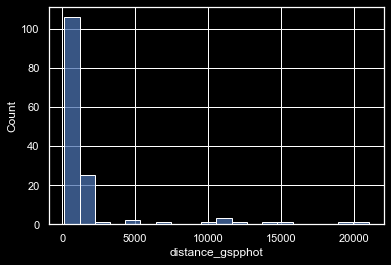

In [92]:
plotly_plots_reverse(df_OB_O, 'distance_gspphot',"Class O Stars " + str(df_OB_O.shape[0]), "Distance (pc) [distance_gspphot]")
sns.histplot(data=df_OB_O, x='distance_gspphot', bins=20);


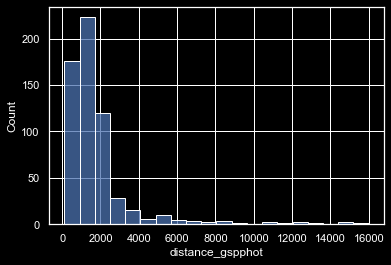

In [93]:
plotly_plots_reverse(df_OB_B, 'distance_gspphot',"Class B Stars " + str(df_OB_B.shape[0]), "Distance (pc) [distance_gspphot]")
sns.histplot(data=df_OB_B, x='distance_gspphot', bins=20);

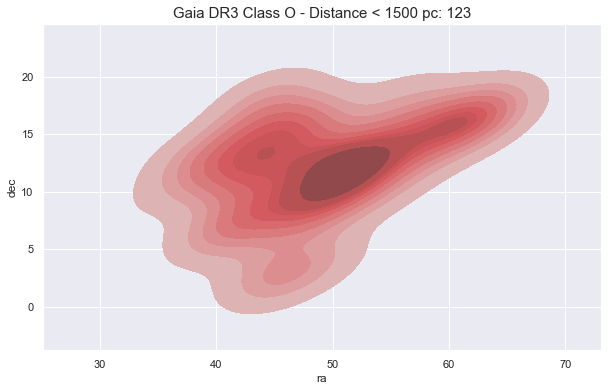

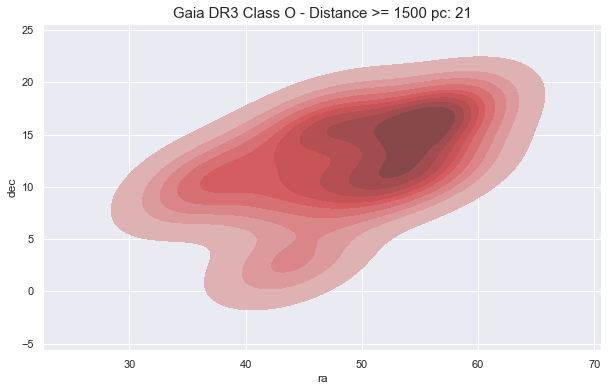

In [94]:
import matplotlib.pyplot as plt

sns.set()

plt.style.library['seaborn']


df = df_OB_O[df_OB_O['distance_gspphot'] < 1500]
df2 = df_OB_O[df_OB_O['distance_gspphot'] >= 1500]

fig = plt.figure(figsize=(10, 6))
sns.kdeplot(
    data=df, x="ra", y="dec", fill=True, color="r");
plt.title('Gaia DR3 Class O - Distance < 1500 pc' + ": " + str(df.shape[0]), fontsize=15);

"""fig = plt.figure(figsize=(10, 6))
sns.kdeplot(
    data=df, x="pmra", y="pmdec", fill=True, color="b", label="Distance < 1500 pc");
sns.kdeplot(
    data=df2, x="pmra", y="pmdec", fill=True, color="r", label="Distance >= 1500 pc");
plt.title('Gaia DR3 Class O - Distance < 1500 pc' + ": " + str(df.shape[0]), fontsize=15);
plt.legend()
ax = plt.gca()
#leg = ax.get_legend()
leg = ax.legend()
leg.legendHandles[0].set_color('red')
leg.legendHandles[1].set_color('blue')
ax.legend(loc='best')""";

"""fig = plt.figure(figsize=(10, 6))
sns.kdeplot(
    data=df, x="pmra", y="pmdec", fill=True, color="r", label="Distance < 1500 pc");
plt.title('Gaia DR3 Class O - Distance < 1500 pc' + ": " + str(df.shape[0]), fontsize=15);""";

plotly_plots(df, 'mh_gspphot',"Class O - Distance < 1500 pc " + str(df.shape[0]), "Iron Abundance [mh_gspphot]")




df = df_OB_O[df_OB_O['distance_gspphot'] >= 1500]

fig = plt.figure(figsize=(10, 6))
sns.kdeplot(
    data=df, x="ra", y="dec", fill=True, color="r");
plt.title('Gaia DR3 Class O - Distance >= 1500 pc' + ": " + str(df.shape[0]), fontsize=15);

"""fig = plt.figure(figsize=(10, 6))
sns.kdeplot(
    data=df, x="pmra", y="pmdec", fill=True, color="r");
plt.title('Gaia DR3 Class O - Distance >= 1500 pc' + ": " + str(df.shape[0]), fontsize=15);""";

plotly_plots(df, 'mh_gspphot',"Class O - Distance >= 1500 pc " + str(df.shape[0]), "Iron Abundance [mh_gspphot]")

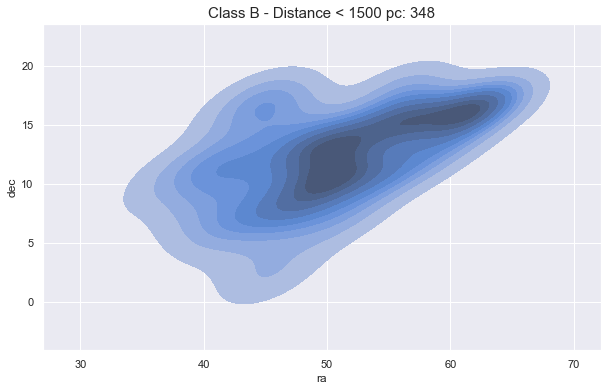

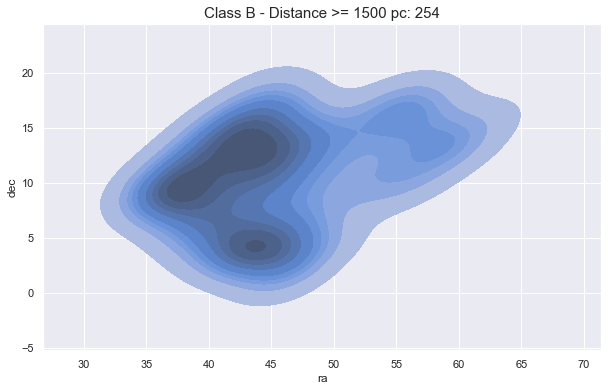

In [95]:
df = df_OB_B[df_OB_B['distance_gspphot'] < 1500]
fig = plt.figure(figsize=(10, 6))
sns.kdeplot(
    data=df, x="ra", y="dec", fill=True, color="b");
plt.title('Class B - Distance < 1500 pc' + ": " + str(df.shape[0]), fontsize=15);
plotly_plots(df, 'mh_gspphot',"Gaia DR3 Class B - Distance < 1500 pc " + str(df.shape[0]), "Iron Abundance [mh_gspphot]")

"""fig = plt.figure(figsize=(10, 6))
sns.kdeplot(
    data=df, x="pmra", y="pmdec", fill=True, color="r", label="Distance < 1500 pc");
plt.title('Gaia DR3 Class B - Distance < 1500 pc' + ": " + str(df.shape[0]), fontsize=15);""";


df = df_OB_B[df_OB_B['distance_gspphot'] >= 1500]
fig = plt.figure(figsize=(10, 6))
sns.kdeplot(
    data=df, x="ra", y="dec", fill=True, color="b");
plt.title('Class B - Distance >= 1500 pc' + ": " + str(df.shape[0]), fontsize=15);
plotly_plots(df, 'mh_gspphot',"Gaia DR3 Class B - Distance >= 1500 pc " + str(df.shape[0]), "Iron Abundance [mh_gspphot]")

"""fig = plt.figure(figsize=(10, 6))
sns.kdeplot(
    data=df, x="pmra", y="pmdec", fill=True, color="r", label="Distance >= 1500 pc");
plt.title('Gaia DR3 Class B - Distance >= 1500 pc' + ": " + str(df.shape[0]), fontsize=15);""";

In [97]:
%%html
<div styles="text-align:center;">
<iframe src="https://gea.esac.esa.int/archive/" width="960" height="540"></iframe>
</div>